<font size = "14"> The creativity of Neural Networks </font>

Artificial neural networks (ANNs), usually simply called neural networks (NNs), are computing systems inspired by the biological neural networks.
It is a model  basically constituted of neurons and edges.



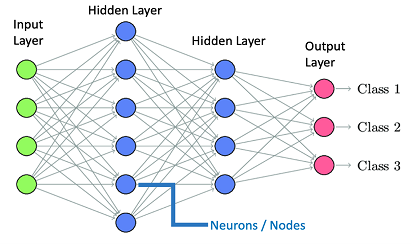

The connections, in this type of model, have weights that adjusts as the learning proceeds. The learning procedure (the weight update) also mimic the human behavior. As a matter of fact, as humans learn through their experience, an artificial neural network learns mainly through its previous mistakes.

The relationship between humans and machines is a sensible matter. Speaking of this topic, it is natural to wonder if there are still things that can only be achieved by human beings. Some things that can be still considered only humans’ peculiarities can be the *creativity* and the possibility of *dreaming*:
is it possible for neural networks to identify some connections between something seeing earlier and a "dream"? Is it possible for neural networks to be creative?

To answer these question, we will explore 2 algorithms: **Style Transfer** and **Deep Dream**.

# Style Transfer

## Theoretical Introduction

**Style transfer** is the technique of recomposing images in the style of other images. In particular, we explored the possibility to transfer artistic style from one painting to another picture using Convolutional Neural Networks. As we know, CNN can well learn hierarchical representations directly from raw images, which is crucial to understand the rationale behind the Style Transfer.
In our case, the results were generated with a VGG-16 Network, a model in the top-5 test accuracy on ImageNet. This network showed the possibility of increasing the accuracy by substituting few big filters, with many small filters of size *(3×3)*.

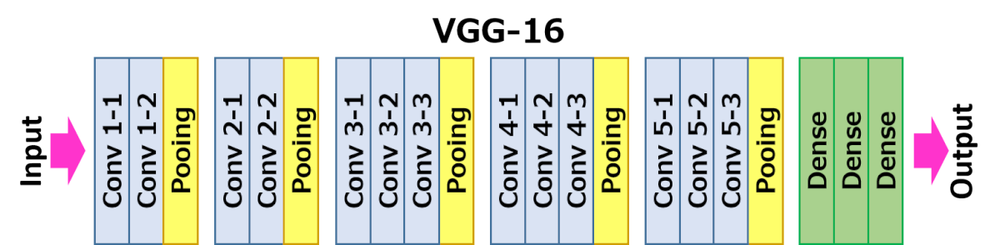

There exist several configurations for the VGG-16 model, but we can generally say that the convolution stride is fixed to *1* pixel, the padding is such that the spatial resolution is preserved, whereas Max-Pooling is performed with a kernel size of *(2×2)* with stride *2*. After a stack of convolutional layers, there are *3* dense layers and the last one,  where the activation is the Softmax, contains *1000* channels. All hidden layers, instead, perform non-linear transformations with ReLu.
Here there is an example of how VGG-net learns low level features. It is possible to see that as we go deeper into the network, these convolutional layers can represent much larger scale features, giving a higher-level representation of the image content:

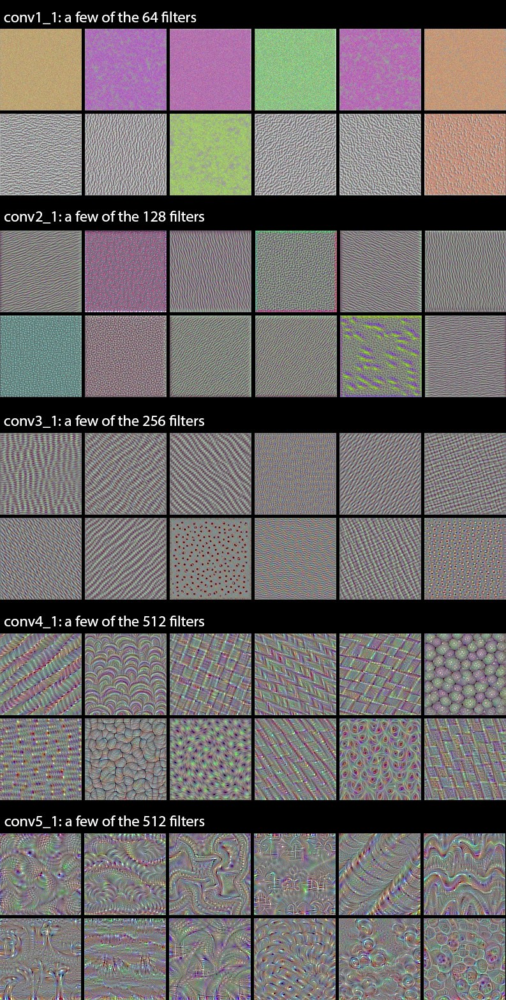

The Style Transfer Algorithm shows that the generic feature representations learned by high-performing Convolutional Neural Networks can be used to independently process and manipulate the content and the style of natural images.

Given a content-image ***C*** and a style image ***S***, we can construct a random image ***Y*** that will be a mixture of the content from *C* with the patterns and colours from *S*. It can be accomplished by minimizing a Loss-function that is the combination of two losses: a ***Content-Loss*** and a ***Style Loss***.

Regarding the reconstruction of the content, the image *Y* can be generated in such a way that its feature maps at a certain Convolutional Layer match the corresponding feature maps of the content-image *C*. And we can iteratively change this generated image to contain the same content represented in the content-image, but not necessarily the same texture and style. This can be done by minimizing the *Content-Loss*.
Given a chosen layer *l*, the *Content-Loss* is defined as the Mean Squared Error between the feature map *F* of our content image *C* and the feature map *P* of our generated image *Y*.

$$ 𝓛_{content} = \frac{1}{2} \sum_{ij}{(F^{l}_{ij} - P^{l}_{ij})^2} $$

$𝓛_{content}$ is minimized iteratively, and it means that the image *Y*, that we initially generated randomly, has now feature activation in the given layers that are very similar to the activation features of the content-image *C*, extracted at layer *l*.

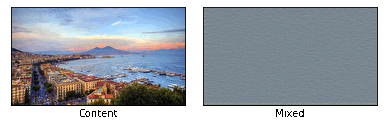

As anticipated, the *Content-Loss* is not the only measure that comes into play. As a matter of fact, another loss function needs to be introduced to apply the style of another image to our generated image *Y*. We will call it *Style-Loss*.

Conceptually, the *Style-Loss* is similar to the *Content-Loss*. However, this time we wish to measure which feature in the style layers activate simultaneously for a style-image S, and then copy this pattern to our image *Y*. It is possible by calculating the Gram-matrix for the tensors output by the style-layers.

The **Gram-matrix** is a matrix of dot-products between the vectorised feature maps *i* and *j* in layer *l*. If an entry in the Gram-matrix has a value close to zero, then it means the two features in the given layer do not activate simultaneously for the given style-image. On the other hand, if an entry in the Gram-matrix has a large value, then it means the two features do activate simultaneously for the given style-image *S*.
If the feature map is a matrix *F*, then each entry in the Gram-Matrix *G* can be calculated as:

$$ G_{ij} = \sum_{k} F_{ik}F_{jk} $$

And we aim to reduce the difference between the Gram-Matrix ***A*** of our randomly generated image *Y* and the Gram-Matrix ***G*** of the style-image *S*. Thus, given a set of layers $l=0,1,…,L$ , the Style-Loss can be formulated as:

$$ 𝓛_{style} = \frac{1}{2} \sum_{l:1}^{L}(G_{ij}^{l} -A_{ij}^{l})^2 $$

$𝓛_{style}$ is minimized iteratively. It results that if two images whose feature maps for each layer l produced the same Gram-Matrices, we would expect both images to have the same style, but not necessarily the same content.

As regards for the selection of layers, it turns out that the best results are achieved by a combination of many different layers from the network, so that it is possible to capture both the finer textures and the larger elements of the original style-image.

So, our final target loss can be defined as a combination of both the Content- and the Style-Loss, that is:

$$ 𝓛_{total} = α𝓛_{content} + \beta𝓛_{content} $$

where α and β are weights that could be tuned to define the amount of content to keep from the content-image and the amount of style to copy from the style-image, respectively.

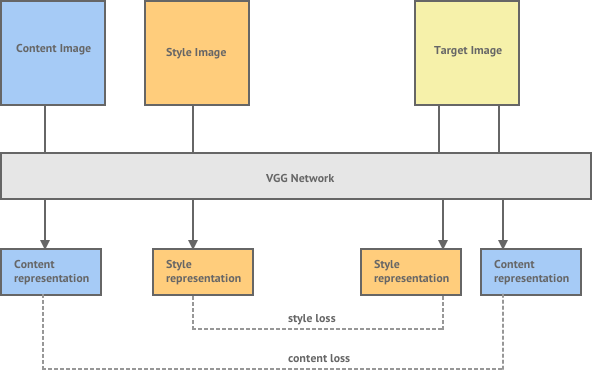

Minimizing this loss function will result in an image representing the content of the content-image but, simultaneously, representing it with the colours and patters extracted from the style-image.

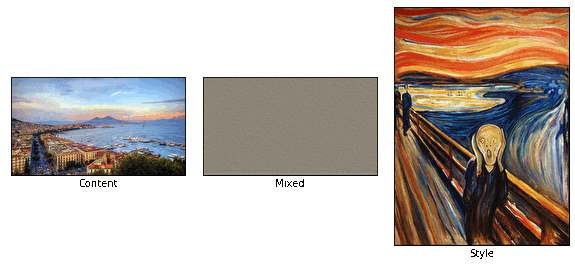

## Imports

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import PIL.Image
import vgg16
import warnings
warnings.filterwarnings("ignore")

This was developed using Python 3.5.2 (Anaconda) and TensorFlow version:

In [ ]:
tf.__version__

'2.7.0'

## VGG-16 Model

The VGG-16 model is downloaded from the internet. This is the default directory where you want to save the data-files. The directory will be created if it does not exist.

In [ ]:
# vgg16.data_dir = 'vgg16/'

Download the data for the VGG-16 model if it doesn't already exist in the directory.

**WARNING: It is 550 MB!**

In [ ]:
vgg16.maybe_download()

- Download progress: 100.0%
Download finished. Extracting files.
Done.


## Help-functions

### Managing images
These functions are used to load, save and plot images.

In [ ]:
def load_image(filename, max_size=None):
    '''
    This function loads an image and returns it as a numpy array of floating-points.
    The image can be automatically resized so the largest of the height or width equals max_size.

    PARAMETERS
    filename [string]:    Filename of the image to load.
    max_size [integer]:   Size of the largest side (default: None).
    '''
    image = PIL.Image.open(filename)

    if max_size is not None:
        # Calculate the appropriate rescale-factor for
        # ensuring a max height and width, while keeping
        # the proportion between them.
        factor = max_size / np.max(image.size)

        # Scale the image's height and width.
        size = np.array(image.size) * factor

        # The size is now floating-point because it was scaled.
        # But PIL requires the size to be integers.
        size = size.astype(int)

        # Resize the image.
        image = image.resize(size, PIL.Image.LANCZOS)

    # Convert to numpy floating-point array.
    return np.float32(image)

In [ ]:
def save_image(image, filename):
    '''
    Save an image as a jpeg-file.
    The image is given as a numpy array with pixel-values between 0 and 255.

    PARAMETERS
    image [numpy array]:  Image to save.
    filename [string]:    Filename to give the image.
    '''
    # Ensure the pixel-values are between 0 and 255.
    image = np.clip(image, 0.0, 255.0)

    # Convert to bytes.
    image = image.astype(np.uint8)

    # Write the image-file in jpeg-format.
    with open(filename, 'wb') as file:
        PIL.Image.fromarray(image).save(file, 'jpeg')

In [ ]:
def plot_image_big(image):
    '''
    This function plots a large image.
    The image is given as a numpy array with pixel-values between 0 and 255.

    PARAMETERS
    image [numpy array]: Image to plot.
    '''
    # Ensure the pixel-values are between 0 and 255.
    image = np.clip(image, 0.0, 255.0)

    # Convert pixels to bytes.
    image = image.astype(np.uint8)

    # Convert to a PIL-image and display it.
    display(PIL.Image.fromarray(image))

In [ ]:
def plot_images(content_image, style_image, mixed_image, smooth = True):
    '''
    This function plots the content-image, the mixed-image and the style-image.

    PARAMETERS
    content_image:  Image from which the content (shapes and contours) is extracted.
    style_image:    Image from which the style (textures and colours) is extracted.
    mixed_image:    Mixture of content_image and style_image.
    smooth:         Use interpolation to smooth pixels?
    '''
    # Create figure with sub-plots.
    fig, axes = plt.subplots(1, 3, figsize=(10, 10))

    # Adjust vertical spacing.
    fig.subplots_adjust(hspace=0.1, wspace=0.1)


    # Interpolation type.
    if smooth:
        interpolation = 'sinc'
    else:
        interpolation = 'nearest'

    # Plot the content-image.
    # Note that the pixel-values are normalized to
    # the [0.0, 1.0] range by dividing with 255.
    ax = axes.flat[0]
    ax.imshow(content_image / 255.0, interpolation=interpolation)
    ax.set_xlabel("Content")

    # Plot the mixed-image.
    ax = axes.flat[1]
    ax.imshow(mixed_image / 255.0, interpolation=interpolation)
    ax.set_xlabel("Mixed")

    # Plot the style-image
    ax = axes.flat[2]
    ax.imshow(style_image / 255.0, interpolation=interpolation)
    ax.set_xlabel("Style")

    # Remove ticks from all the plots.
    for ax in axes.flat:
        ax.set_xticks([])
        ax.set_yticks([])

    # Ensure the plot is shown correctly with multiple plots
    # in a single Notebook cell.
    plt.show()

### Loss Functions

These functions create the loss-functions that are used in optimization with TensorFlow.

In [ ]:
def mean_squared_error(a, b):
    '''
    This function creates a TensorFlow operation for calculating the Mean Squared Error between the two input tensors.

    PARAMETERS
    a [Tensorflow tensor]: Tensor 1
    b [Tensorflow tensor]: Tensor 2

    OUTPUT
    MSE between Tensor 1 and Tensor 2.
    '''
    return tf.reduce_mean(tf.square(a - b))

In [ ]:
def create_content_loss(session, model, content_image, layer_ids):
    """
    This function creates the loss-function for the content-image.
    It is the Mean Squared Error of the feature activations in the given layers
    in the model, between the content-image and the mixed-image.

    When this content-loss is minimized, it therefore means that the mixed-image
    has feature activations in the given layers that are very similar to the
    activations of the content-image.

    Depending on which layers you select, this should transfer the contours
    from the content-image to the mixed-image.

    PARAMETERS
    session [Tensorflow session]:   An open TensorFlow session for running the model's graph.
    model [Tensorflow model]:       The model, that is, an instance of the VGG16-class.
    content_image [numpy array]:    Numpy float array with the content-image.
    layer_ids [list]:               List of integer id's for the layers to use in the model.

    OUTPUT
    total_loss [float]:   Average of the losses for all selected layers.
    """

    # Create a feed-dict with the content-image.
    feed_dict = model.create_feed_dict(image=content_image)

    # Get references to the tensors for the given layers.
    layers = model.get_layer_tensors(layer_ids)
    # Calculate the output values of those layers when
    # feeding the content-image to the model.
    values = session.run(layers, feed_dict=feed_dict)

    # Set the model's graph as the default so we can add
    # computational nodes to it.
    with model.graph.as_default():
        # Initialize an empty list of loss-functions.
        layer_losses = []

        # For each layer and its corresponding values
        # for the content-image.
        for value, layer in zip(values, layers):
            # These are the values that are calculated
            # for this layer in the model when inputting
            # the content-image. Wrap it to ensure it
            # is a constant Tensorflow Tensor
            value_const = tf.constant(value)

            # The loss-function for this layer is the
            # Mean Squared Error between the layer-values
            # when inputting the content- and mixed-images.
            loss = mean_squared_error(layer, value_const)

            # Add the loss-function for this layer to the
            # list of loss-functions.
            layer_losses.append(loss)

        # The combined loss for all layers is just the average.
        # The loss-functions could be weighted differently for
        # each layer.
        total_loss = tf.reduce_mean(layer_losses)

    return total_loss

In [ ]:
def gram_matrix(tensor):
    '''
    This is the helper-function for calculating the Gram-matrix of a tensor
    output by a convolutional layer in the neural network.

    The Gram-matrix is a matrix of dot-products for the vectors of the
    feature activations of a style-layer.
    If an entry in the Gram-matrix has a value close to zero then it means
    the two features in the given layer do not activate simultaneously
    for the given style-image. On the other hand, if an entry in the
    Gram-matrix has a large value, then it means the two features do activate
    simultaneously for the given style-image.

    PARAMETERS
    tensor [Tensorflow Tensor]: Tensor output by a convolutional layer of the Network

    OUTPUT
    gram [Tensorflow Tensor]: Gram-matrix of tensor.
    '''
    shape = tensor.get_shape()

    # Get the number of feature channels for the input tensor,
    # which is assumed to be from a convolutional layer with 4-dim.
    num_channels = int(shape[3])

    # Reshape the tensor so it is a 2-dim matrix. This essentially
    # flattens the contents of each feature-channel.
    matrix = tf.reshape(tensor, shape=[-1, num_channels])

    # Calculate the Gram-matrix as the matrix-product of
    # the 2-dim matrix with itself. This calculates the
    # dot-products of all combinations of the feature-channels.
    gram = tf.matmul(tf.transpose(matrix), matrix)

    return gram

In [ ]:
def create_style_loss(session, model, style_image, layer_ids):
    '''
    Create the loss-function for the style-image.
    It calculates the Mean Squared Error for the Gram-matrices.

    The Gram Matrix measures which features in the style-layers activate
    simultaneously for the style-image. Thus, when the style_loss is minimized,
    this activation-pattern are copied to the mixed-image, in other words,
    the mixed-image replicates the pattern of the style-image.

    PARAMETERS
    session [Tensorflow session]:   An open TensorFlow session for running the model's graph.
    model [Tensorflow model]:       The model, that is, an instance of the VGG16-class.
    style_image [numpy array]:      Numpy float array with the style-image.
    layer_ids [list]:               List of integer id's for the layers to use in the model.

    OUTPUT
    total_loss [float]:   Average of the losses for all layers.
    '''

    # Create a feed-dict with the style-image.
    feed_dict = model.create_feed_dict(image=style_image)

    # Get references to the tensors for the given layers.
    layers = model.get_layer_tensors(layer_ids)

    # Set the model's graph as the default so we can add
    # computational nodes to it. It is not always clear
    # when this is necessary in TensorFlow, but if you
    # want to re-use this code then it may be necessary.
    with model.graph.as_default():
        # Construct the TensorFlow-operations for calculating
        # the Gram-matrices for each of the layers.
        gram_layers = [gram_matrix(layer) for layer in layers]

        # Calculate the values of those Gram-matrices when
        # feeding the style-image to the model.
        values = session.run(gram_layers, feed_dict=feed_dict)

        # Initialize an empty list of loss-functions.
        layer_losses = []

        # For each Gram-matrix layer and its corresponding values.
        for value, gram_layer in zip(values, gram_layers):
            # These are the Gram-matrix values that are calculated
            # for this layer in the model when inputting the
            # style-image. Wrap it to ensure it is a const,
            # although this may be done automatically by TensorFlow.
            value_const = tf.constant(value)

            # The loss-function for this layer is the
            # Mean Squared Error between the Gram-matrix values
            # for the content- and mixed-images.
            # Note that the mixed-image is not calculated
            # yet, we are merely creating the operations
            # for calculating the MSE between those two.
            loss = mean_squared_error(gram_layer, value_const)

            # Add the loss-function for this layer to the
            # list of loss-functions.
            layer_losses.append(loss)

        # The combined loss for all layers is just the average.
        # The loss-functions could be weighted differently for
        # each layer.
        total_loss = tf.reduce_mean(layer_losses)

    return total_loss

In [ ]:
def create_denoise_loss(model):
    '''
    This creates the loss-function for denoising the mixed-image.

    Particularly, it applies the Total Variation Denoising algotithm,
    which essentially just shifts the image one pixel in the x- and y-axis,
    calculates the difference from the original image,
    takes the absolute value to ensure the difference is a positive number,
    and sums over all the pixels in the image.

    Minimizing this loss-function results in the suppression of some noise in the image.
    '''
    loss = tf.reduce_sum(tf.abs(model.input[:,1:,:,:] - model.input[:,:-1,:,:])) + \
           tf.reduce_sum(tf.abs(model.input[:,:,1:,:] - model.input[:,:,:-1,:]))

    return loss

[Total Variation Denoising Algorithm](https://en.wikipedia.org/wiki/Total_variation_denoising)

## Style-Transfer Algorithm

In [ ]:
def style_transfer(content_image,
                   style_image,
                   content_layer_ids,
                   style_layer_ids,
                   weight_content = 1.5,
                   weight_style = 10.0,
                   weight_denoise = 0.3,
                   num_iterations = 120,
                   step_size = 10.0):
    '''
    The Style Transfer Algorithm initializes a random noise image (of the same
    size of the content-image) and, then, it uses gradient descent to iteratively
    minimize the loss-functions of the content-layers and style-layers.
    This should result in a mixed-image that resembles the contours of the
    content-image, and resembles the colours and textures of the style-image.

    This algorithm also uses normalization of the loss-functions.
    It allows to set the loss-weights independently of the chosen style- and content-layers.

    PARAMETERS
    content_image [numpy 3-dim float-array]:  Content-image.
    style_image [numpy 3-dim float-array]:    Style-image.
    content_layer_ids [list]:                 List of integers identifying the content-layers.
    style_layer_ids [list]:                   List of integers identifying the style-layers.
    weight_content [float]:                   Weight for the content-loss-function (Default: 1.5).
    weight_style [float]:                     Weight for the style-loss-function (Default: 10.0).
    weight_denoise [float]:                   Weight for the denoising-loss-function (Default: 0.3).
    num_iterations [int]:                     Number of optimization iterations to perform (Default: 120).
    step_size [float]:                        Step-size for the gradient in each iteration (Default 10.0).

    OUTPUT
    mixed_image [numpy 3-dim float-array]:    Mixed-image.
    '''

    # Create an instance of the VGG16-model. This is done
    # in each call of this function, because we will add
    # operations to the graph so it can grow very large
    # and run out of RAM if we keep using the same instance.
    model = vgg16.VGG16()

    # Create a TensorFlow-session.
    session = tf.compat.v1.InteractiveSession(graph=model.graph)

    # Print the names of the content-layers.
    print("Content layers:")
    print(model.get_layer_names(content_layer_ids))
    print()

    # Print the names of the style-layers.
    print("Style layers:")
    print(model.get_layer_names(style_layer_ids))
    print()

    # Create the loss-function for the content-layers and -image.
    loss_content = create_content_loss(session=session,
                                       model=model,
                                       content_image=content_image,
                                       layer_ids=content_layer_ids)

    # Create the loss-function for the style-layers and -image.
    loss_style = create_style_loss(session=session,
                                   model=model,
                                   style_image=style_image,
                                   layer_ids=style_layer_ids)

    # Create the loss-function for the denoising of the mixed-image.
    loss_denoise = create_denoise_loss(model)

    # Create TensorFlow variables for adjusting the values of
    # the loss-functions. This is explained below.
    adj_content = tf.Variable(1e-10, name='adj_content')
    adj_style = tf.Variable(1e-10, name='adj_style')
    adj_denoise = tf.Variable(1e-10, name='adj_denoise')

    # Initialize the adjustment values for the loss-functions.
    session.run([adj_content.initializer,
                 adj_style.initializer,
                 adj_denoise.initializer])

    # Create TensorFlow operations for updating the adjustment values.
    # These are basically just the reciprocal values of the
    # loss-functions, with a small value 1e-10 added to avoid the
    # possibility of division by zero.
    update_adj_content = adj_content.assign(1.0 / (loss_content + 1e-10))
    update_adj_style = adj_style.assign(1.0 / (loss_style + 1e-10))
    update_adj_denoise = adj_denoise.assign(1.0 / (loss_denoise + 1e-10))

    # This is the weighted loss-function that we will minimize
    # below in order to generate the mixed-image.
    # Because we multiply the loss-values with their reciprocal
    # adjustment values, we can use relative weights for the
    # loss-functions that are easier to select, as they are
    # independent of the exact choice of style- and content-layers.
    loss_combined = weight_content * adj_content * loss_content + \
                    weight_style * adj_style * loss_style + \
                    weight_denoise * adj_denoise * loss_denoise

    # Use TensorFlow to get the mathematical function for the
    # gradient of the combined loss-function with regard to
    # the input image.
    gradient = tf.gradients(loss_combined, model.input)

    # List of tensors that we will run in each optimization iteration.
    run_list = [gradient, update_adj_content, update_adj_style, \
                update_adj_denoise]

    # The mixed-image is initialized with random noise.
    # It is the same size as the content-image.
    mixed_image = np.random.rand(*content_image.shape) + 128

    for i in range(num_iterations):
        # Create a feed-dict with the mixed-image.
        feed_dict = model.create_feed_dict(image=mixed_image)

        # Use TensorFlow to calculate the value of the
        # gradient, as well as updating the adjustment values.
        grad, adj_content_val, adj_style_val, adj_denoise_val \
        = session.run(run_list, feed_dict=feed_dict)

        # Reduce the dimensionality of the gradient.
        grad = np.squeeze(grad)

        # Scale the step-size according to the gradient-values.
        step_size_scaled = step_size / (np.std(grad) + 1e-8)

        # Update the image by following the gradient.
        mixed_image -= grad * step_size_scaled

        # Ensure the image has valid pixel-values between 0 and 255.
        mixed_image = np.clip(mixed_image, 0.0, 255.0)

        # Print a little progress-indicator.
        print(". ", end="")

        # Display status once every 10 iterations, and the last.
        if (i % 10 == 0) or (i == num_iterations - 1):
            print()
            print("Iteration:", i)

            # Print adjustment weights for loss-functions.
            msg = "Weight Adj. for Content: {0:.2e}, Style: {1:.2e}, Denoise: {2:.2e}"
            print(msg.format(adj_content_val, adj_style_val, adj_denoise_val))

            # Plot the content-, style- and mixed-images.
            plot_images(content_image=content_image,
                        style_image=style_image,
                        mixed_image=mixed_image)

    print()
    print("Final image:")
    plot_image_big(mixed_image)

    # Close the TensorFlow session to release its resources.
    session.close()

    # Return the mixed-image.
    return mixed_image

## Application

This example shows how to transfer the style of various images onto another image.

First we load the **content-image** which has the overall contours that we want in the mixed-image.

In [ ]:
content_filename = '/content/napoli.jpg'
content_image = load_image(content_filename, max_size=300)

Then we load the **style-image** which has the colours and textures we want in the mixed-image.

In [ ]:
style_filename = '/content/urlo.jpg'
style_image = load_image(style_filename, max_size=300)

Then we define a list of integers which identify the layers in the neural network that we want to use for matching the content-image. These are indices into the layers in the neural network. For the VGG16 model, the 5th layer (index 4) seems to work well.

In [ ]:
content_layer_ids = [4]

Then we define another list of integers for the style-layers.

In [ ]:
# The VGG16-model has 13 convolutional layers.
# This selects all those layers as the style-layers.
style_layer_ids = list(range(13))

# You can also select a sub-set of the layers, e.g. like this:
# style_layer_ids = [1, 2, 3, 4]

Now perform the style-transfer. This automatically creates the appropriate loss-functions for the style- and content-layers, and then performs a number of optimization iterations. This will gradually create a mixed-image which has similar contours as the content-image, with the colours and textures being similar to the style-image.

In [ ]:
# %%time
img = style_transfer(content_image = content_image,
                     style_image = style_image,
                     content_layer_ids = content_layer_ids,
                     style_layer_ids = style_layer_ids,
                     weight_content = 0,
                     weight_style = 1.0,
                     weight_denoise = 0,
                     num_iterations = 120,
                     step_size = 10.0)

## Other Results



In this section, a plethora of experimental results will be shown.

### 1) Naples Cityscape

**Content Image:**

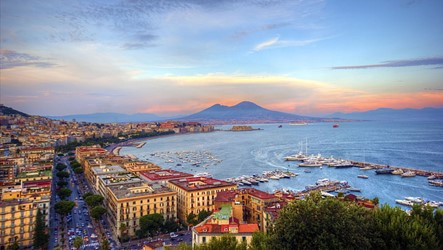

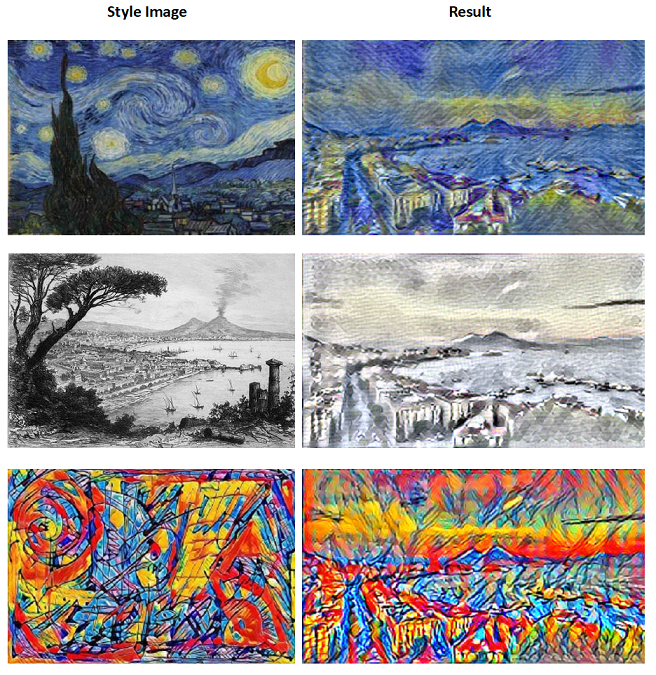

### 2) Girl with a Pearl Earring

**Content Image**

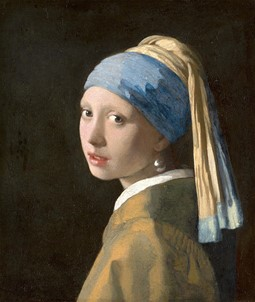

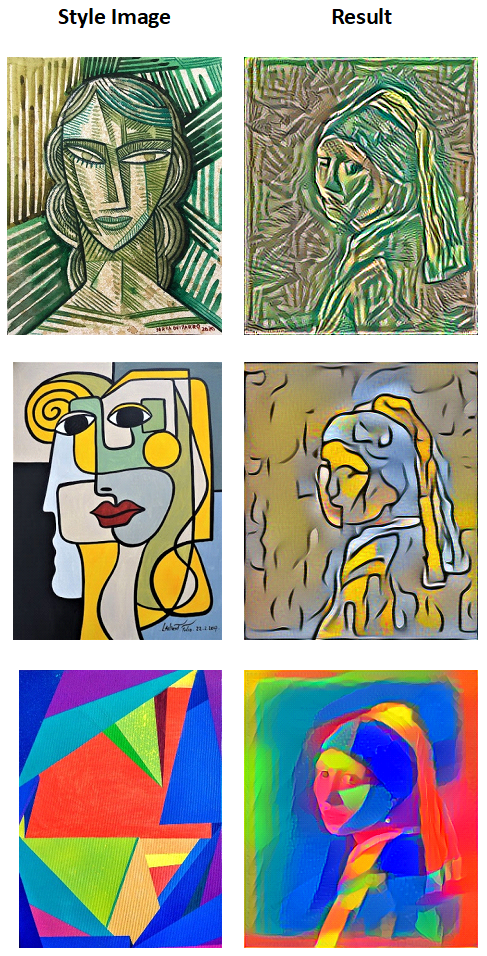

# Deep Dream

## Theoretical Introduction

Another way to explore the connection between Neural Network and creativity is with the ***Dreap Dream Algorithm***.

Deep dream, obviously, cannot be only considered as a way to introduce creativity in learning models. As a matter of fact, it is a computer vision algorithm used mainly to understand better the emergent structure of the neural network. It works by taking an image classification model and running gradient ascent over an input image in order to maximize the activations of specific layers for this input. It is based on the concept that, once trained, a network can also be run in reverse, being asked to adjust the original image slightly so that a given output neuron  yields a higher confidence score.

This technique produces hallucination-like visuals by changing the input image on what the layer/output want to see in order to fire with more probability. The optimization phase resembles backpropagation, however instead of adjusting the network weights, the weights are held fixed, and the input is adjusted.

General workflow of the algorithm:

- Load the original image.
- Define a number of iterations, which will represent a number of processing scales, from smallest to largest, the image will be resized to.
- Resize the original image to the smallest scale.
- For every scale, starting with the smallest (i.e. current one):
    - Run gradient ascent
    - Upscale image to the next scale
    - Reinject the detail that was lost at upscaling time
- Stop when we are back to the original size.
To obtain the detail lost during upscaling, we simply
take the original image, shrink it down, upscale it,
and compare the result to the (resized) original image.

<br>
<br>

The model on which our Deep Dream Algorithm will be implemented is the Inception-net.

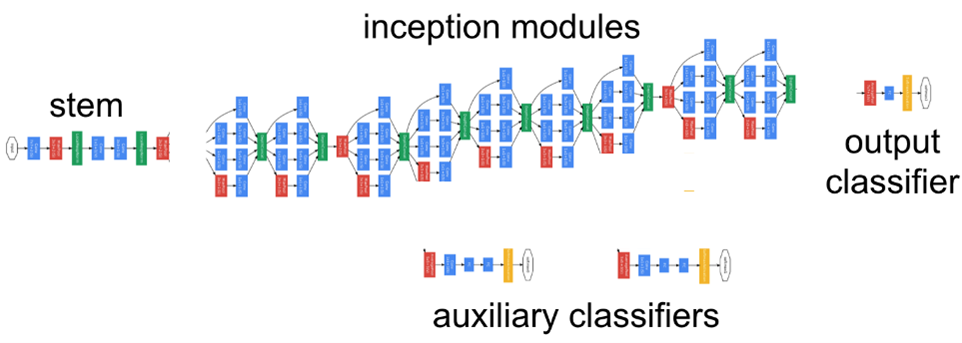

Inception-net is a convolutional neural network which tries to improve the performance by replacing fully connected layers by sparse ones. The sparseness allows to increase the size of the model while contemporary facing two key issues: the increase in the number of the parameters which makes the enlarged network more prone to overfitting, especially if the number of labeled examples in the training set is limited and the increase of the computational resources.

The initial part of the architecture is much like a traditional convolutional network and it is referred to as the stem. The key part of the network is an intermediate layer, referred to as an inception module. The basic idea of the inception module is that key information in the images is available at various levels of detail. The problem is that we do not know up front which level of detail is appropriate for each region of the image. So, a grade of flexibility is imposed with the inception module which convolves with three or more different filter sizes in parallel. The final part of the network is a common output classifier.

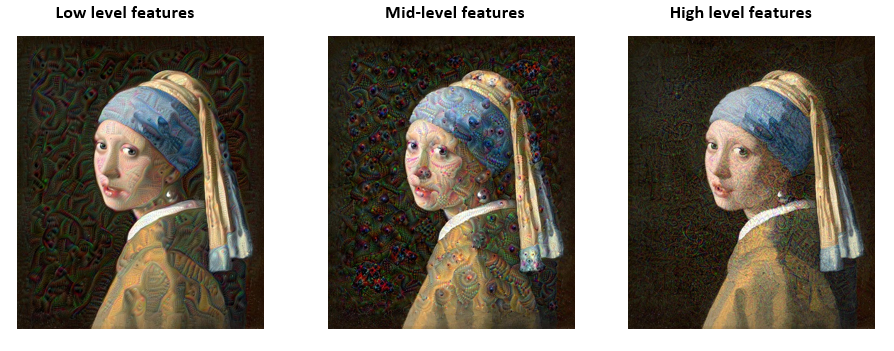

## Imports

In [ ]:
# -- To set up the model -- #
import numpy as np
import tensorflow as tf
from tensorflow import keras

# -- To display images -- #
from IPython.display import Image, display

## Inception_v3 Model

The network will be imported using a sub-module of Keras, which allows also to set the weights of ImageNet.

In [ ]:
from tensorflow.keras.applications import inception_v3

## Help-functions

### Processing images
The functions below allow to process and deprocess images.  
The processing phase is manly used both to prepare the images in a suitable format for the training and for scaling.  
The deprocessing phase converts back the images in its original shape and its original format.

In [ ]:
def preprocess_image(image_path):
    '''
    This function takes the image path as input, then load the image
    and change its shape from a tensor of the form (*,*,3) to (1,*,*,3).
    After the expansion, a preprocessing step is performed using
    the function preprocess_input() of the inception_v3 class

    PARAMETERS
    image_path [string]:    Path of the image to load.

    OUTPUT
    img [ndarray]: Numpy array version of the image
    '''
    # Util function to open, resize and format pictures
    # into appropriate arrays.
    img = keras.preprocessing.image.load_img(image_path) # Load image
    img = keras.preprocessing.image.img_to_array(img) # Convert to array
    img = np.expand_dims(img, axis=0) # Insert a new axis that will appear at the axis position in the expanded array shape.
    img = inception_v3.preprocess_input(img) # The inputs pixel values are scaled between -1 and 1, sample-wise.
    return img

In [ ]:
def deprocess_image(x):
    '''
    The function takes an array image as input and it converts back to the shape (*,*,3).
    Then the deprocessing steps are performed to convert back the processing of the
    inception_v3.preprocess_input() function

    PARAMETERS
    x [ndarray]:    Numpy array image of shape (1,*,*,3)

    OUTPUT
    x [ndarray]: Numpy array of the deprocessed image
    '''
    # Util function to convert a NumPy array into a valid image.
    x = x.reshape((x.shape[1], x.shape[2], 3))
    # Undo inception v3 preprocessing
    x /= 2.0
    x += 0.5
    x *= 255.0
    # Convert to uint8 and clip to the valid range [0, 255]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

### Loss functions
In the first part of this section the loss function is computed. The actual loss function is a linear combination of several loss factors. Each loss factors refer to a selected layer. The single loss factor is a measure of which and how many features are activated by a given layer.

In the second snippet, the input image will be changed using a gradient ascent algorithm. In this way the image will be modified in order to activate the features discovered before in a prominent way. The gradient ascent algorithm is applied either a specified number of times or until a prefixed value of loss is reached.


In [ ]:
def compute_loss(input_image):
    '''
    The function computes, for each chosen layer, a loss factor which is
    the sum of the squared valued of each pixel. These are then normalized by
    a scaling factor, which is the number of total pixels in the tensor.
    The actual loss is a linear combination of these loss factors, weighted by
    chosen coefficients.

    PARAMETERS
    input_image [ndarray]:    Numpy array image

    OUTPUT
    loss [int]: loss function calculation
    '''
    features = feature_extractor(input_image) # dict {'layer name': output}
    # Initialize the loss
    loss = tf.zeros(shape=()) #
    for name in features.keys():
        coeff = layer_settings[name] # Take the weight assigned to that specific layer
        activation = features[name] # Output(s) of the layer(s) selected in "layer_settings", given the input image.
        # We avoid border artifacts by only involving non-border pixels in the loss.
        scaling = tf.reduce_prod(tf.cast(tf.shape(activation), "float32")) # Number of elements in the layer to normalize
        loss += coeff * tf.reduce_sum(tf.square(activation[:, 2:-2, 2:-2, :])) / scaling
    return loss

In [ ]:
@tf.function
def gradient_ascent_step(img, learning_rate):
    '''
    Given an input image execute the gradient ascent algorithm
    in order to update the input image, in such a way that the
    features of each layer are activated in a prominent way

    PARAMETERS
    img [ndarray]: numpy array of the current version of the input image
    learning_rate [int]: step size of the learning procedure

    OUTPUTS
    loss [int]: loss function calculation
    img [ndarray]: updated numpy array image
    '''
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img)
    # Compute gradients.
    grads = tape.gradient(loss, img)  # Computes the gradient. 'loss' will be differentiated against 'img'.
                                      # Which are the pixels of the image to change to increase the loss? -> follow the gradient.
    # Normalize gradients.
    grads /= tf.maximum(tf.reduce_mean(tf.abs(grads)), 1e-6) # Divide by the maximum between the mean of the gradients and 1e-6 (otherwise division too close to 0).
    # Gradient Ascent.
    img += learning_rate * grads # Update image to maximize the loss function (move through the direction of the maximum)
    return loss, img

def gradient_ascent_loop(img, iterations, learning_rate, max_loss=None):
    '''
    The function update the input image using the function gradient_ascent_step()
    until either a number of iterations or a given loss are reahced.

    PARAMETERS
    img [ndarray]: numpy array of the current version of the input image
    learning_rate [int]: step size of the learning procedure
    iterations [int]: fixed number of iterations
    max_loss [int]: maximum value of the loss (default: None)

    OUTPUT
    img [ndarray]: updated numpy array image
    '''
    for i in range(iterations):
        loss, img = gradient_ascent_step(img, learning_rate)
        if max_loss is not None and loss > max_loss: # Early stopping criterion
            break
        print("... Loss value at step %d: %.2f" % (i, loss))
    return img

## Application


In the first section all the parameters are set. They are the url of the input image, the names and weights of the layers whose activation needs to be maximized, the step size, the number of times the image must be resized, the scaling factor, the total number of iterations and a maximum loss value that defines an early stopping criterion.


In [ ]:
# -- LOAD BASE IMAGE -- #

# To load the image from the web:
# base_image_path = keras.utils.get_file("filename", "web-url")

# To load the image from local path:
base_image_path = '/content/Girl_with_a_Pearl_Earring.jpg'

# Filename of the output image:
result_prefix = 'portrait_dream'

# These are the names of the layers
# for which we try to maximize activation,
# as well as their weight in the final loss
layer_settings = {
    'mixed4': 2.5,
    'mixed5': 2.0,
    'mixed6': 1.5,
    'mixed7': 1.0
}

# -- HYPERPARAMETERS -- #
step = 0.01         # Gradient ascent step size
num_octave = 3      # Number of scales at which to run gradient ascent
octave_scale = 1.4  # Size ratio between scales
iterations = 40     # Number of ascent steps per scale
max_loss = 20.0     # Early stopping criterion

This is our base image:


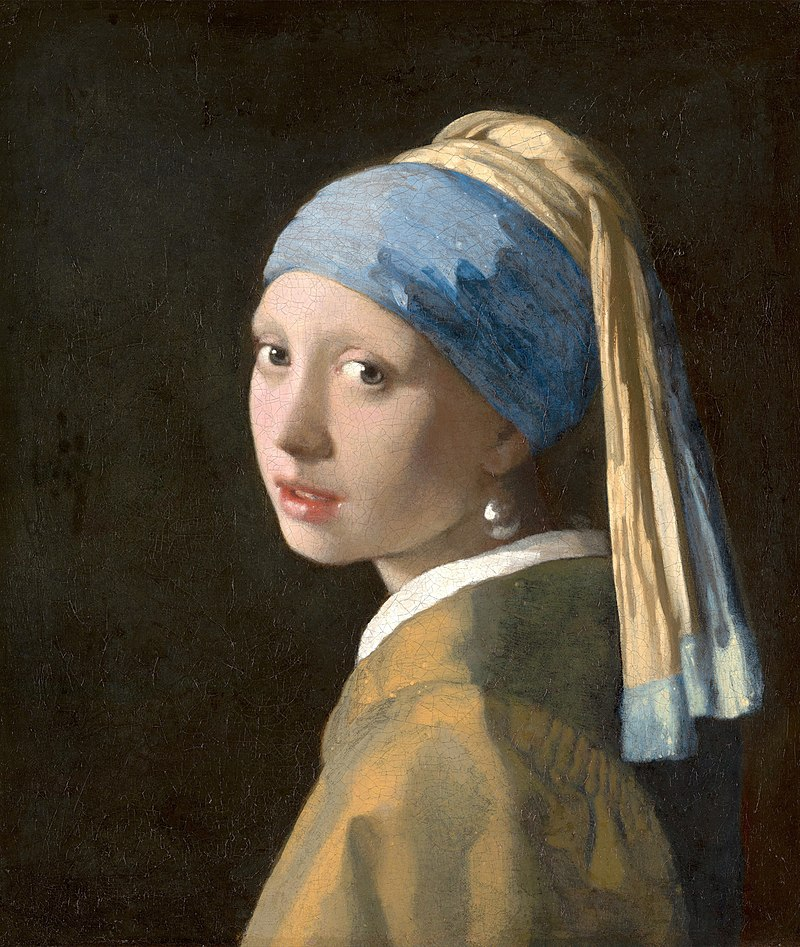

In [ ]:
display(Image(base_image_path))

Build a feature extraction model to retrieve the activations of our target layers given an input image.

In [ ]:
# Build an InceptionV3 model loaded with pre-trained ImageNet weights
model = inception_v3.InceptionV3(weights="imagenet", include_top=False)

# Get the symbolic outputs of each "key" layer.
outputs_dict = dict([(layer.name, layer.output) for layer in [model.get_layer(name) for name in layer_settings.keys()]])

# Set up a model that returns the activation values for every target layer (as a dict)
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

Run the training loop, iterating over different steps. Recall that, at each step, the image is processed at different shape.


In [ ]:
original_img = preprocess_image(base_image_path) # Take input image and apply preprocessing
original_shape = original_img.shape[1:3] # Takes its shape, excluding the batch size factor

successive_shapes = [original_shape] # Initialize a list of shapes with the actual shape
for i in range(1, num_octave): # Iterate for 'num_octave', which is the number of scales at which to run gradient ascent.
    shape = tuple([int(dim / (octave_scale ** i)) for dim in original_shape]) # Where 'octave_scale' is the size ratio between scales.
    successive_shapes.append(shape) # Add the successive shapes to the list 'successive_shapes'.
successive_shapes = successive_shapes[::-1] # Reordering from the smallest to the largest shape.
shrunk_original_img = tf.image.resize(original_img, successive_shapes[0]) # Initialize the image to the first shape, i.e. the smallest shape.

img = tf.identity(original_img)  # Make a copy of the original image.
restart = False # Sentinel to advise the user if restarting the runtime is needed.
for i, shape in enumerate(successive_shapes):
    print("Processing octave %d with shape %s" % (i, shape))
    img = tf.image.resize(img, shape) # Resize image to current shape at iteration i.
    try:
      with tf.device('/GPU:0'):
        img = gradient_ascent_loop(
            img, iterations=iterations, learning_rate=step, max_loss=max_loss
        )
    except tf.errors.FailedPreconditionError:
      restart = True
      print('Please, restart the runtime and run again.')
      break
    # Given a destination size (shape),
    # how much details have been lost by resizing from a shrunked image (smaller) to shape, with respect to resizing from the original image (bigger) to shape?
    upscaled_shrunk_original_img = tf.image.resize(shrunk_original_img, shape) # Resize from small(shrunk) -> size.
    same_size_original = tf.image.resize(original_img, shape) # Resize from original -> size.
    lost_detail = same_size_original - upscaled_shrunk_original_img # Lost details.

    img += lost_detail # Reinject the lost details.
    shrunk_original_img = tf.image.resize(original_img, shape)

keras.preprocessing.image.save_img(result_prefix + ".png", deprocess_image(img.numpy()))

Processing octave 0 with shape (483, 408)
... Loss value at step 0: 0.78
... Loss value at step 1: 1.11
... Loss value at step 2: 1.43
... Loss value at step 3: 1.77
... Loss value at step 4: 2.13
... Loss value at step 5: 2.46
... Loss value at step 6: 2.80
... Loss value at step 7: 3.12
... Loss value at step 8: 3.44
... Loss value at step 9: 3.78
... Loss value at step 10: 4.11
... Loss value at step 11: 4.43
... Loss value at step 12: 4.74
... Loss value at step 13: 5.10
... Loss value at step 14: 5.43
... Loss value at step 15: 5.74
... Loss value at step 16: 6.03
... Loss value at step 17: 6.34
... Loss value at step 18: 6.65
... Loss value at step 19: 6.96
... Loss value at step 20: 7.28
... Loss value at step 21: 7.54
... Loss value at step 22: 7.87
... Loss value at step 23: 8.11
... Loss value at step 24: 8.42
... Loss value at step 25: 8.68
... Loss value at step 26: 8.97
... Loss value at step 27: 9.23
... Loss value at step 28: 9.48
... Loss value at step 29: 9.75
... Loss

Display the result.


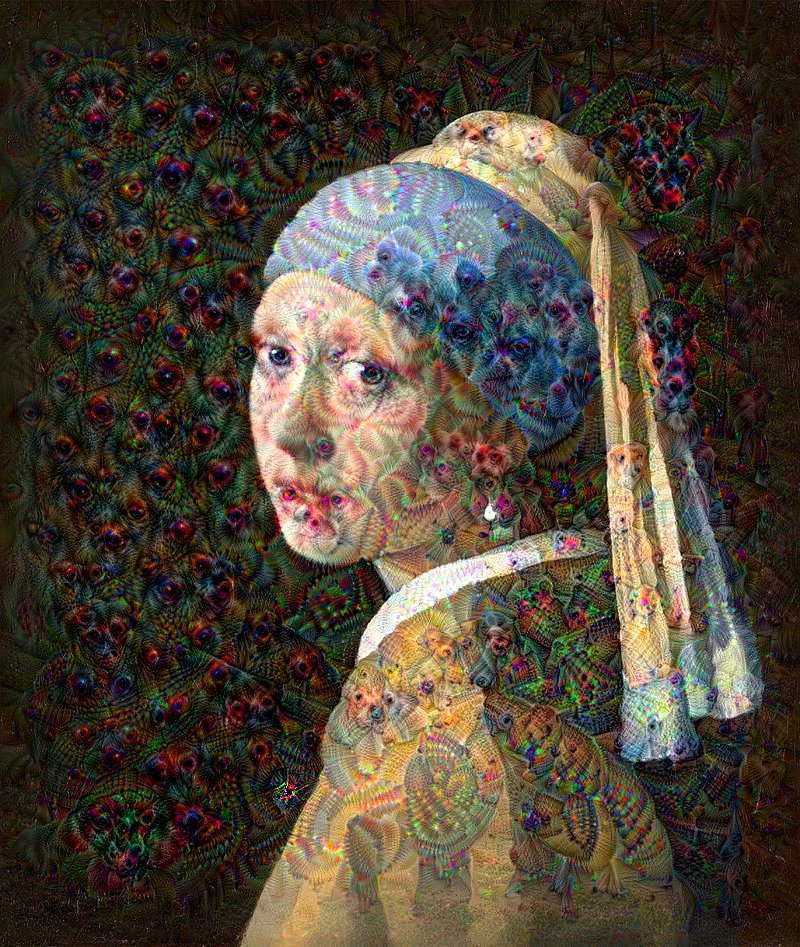

In [ ]:
if restart == True:
  print('Please, restart the runtime and run again.')
else:
  display(Image(result_prefix + ".png"))

## Other Results

In this section, a plethora of experimental results will be shown.

### Low level features

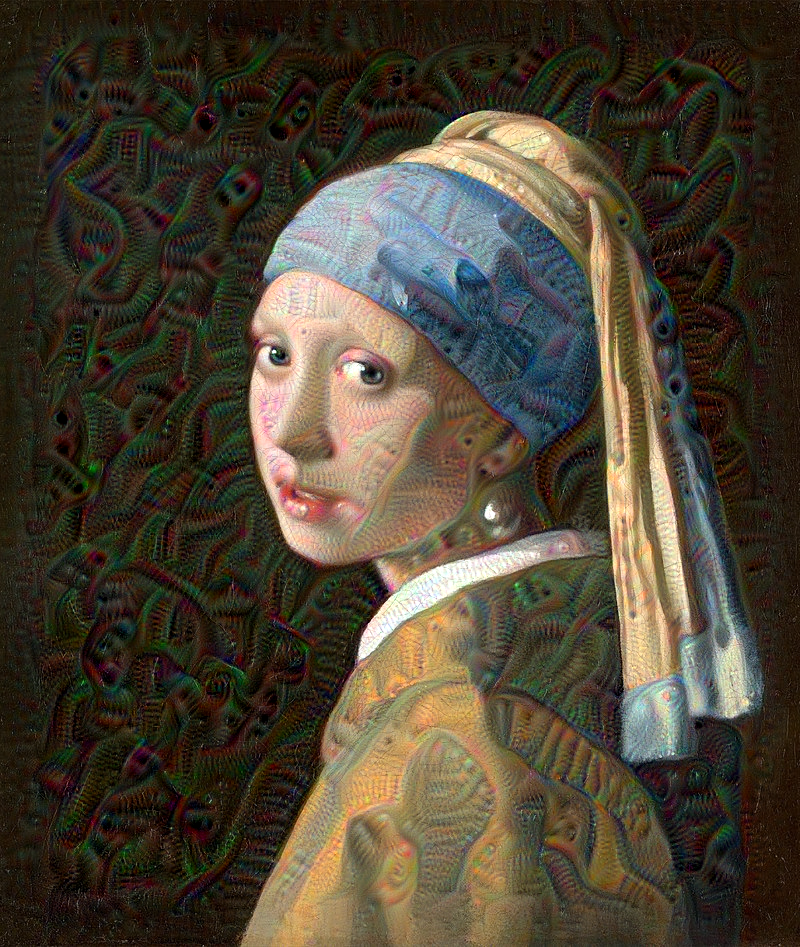

### Mid level features

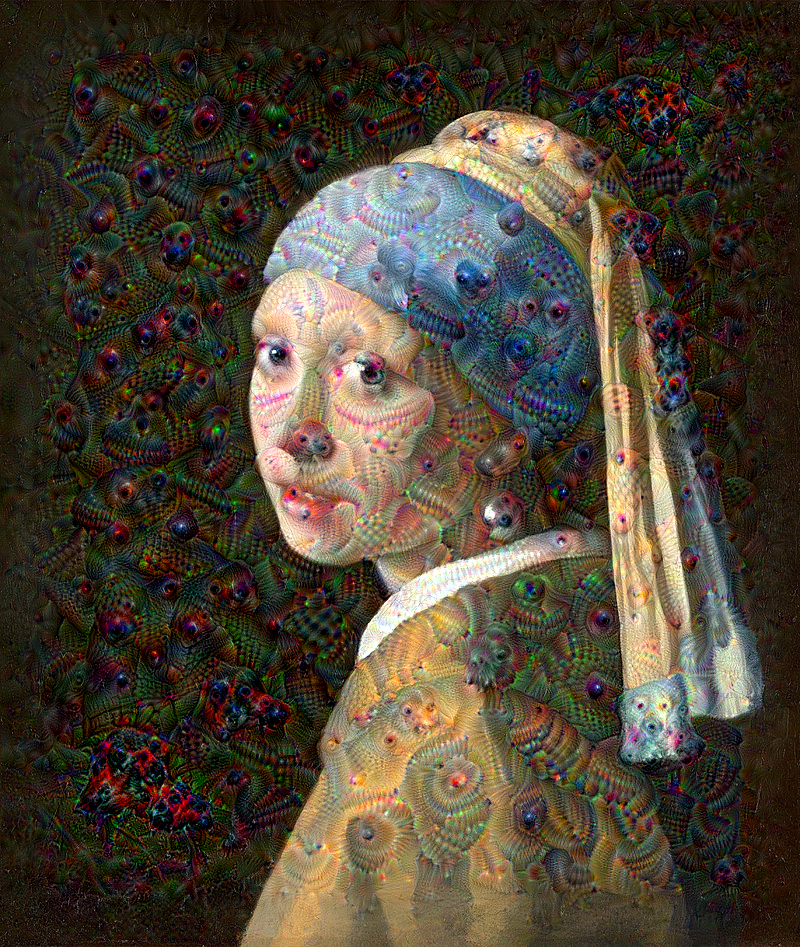

### High level features

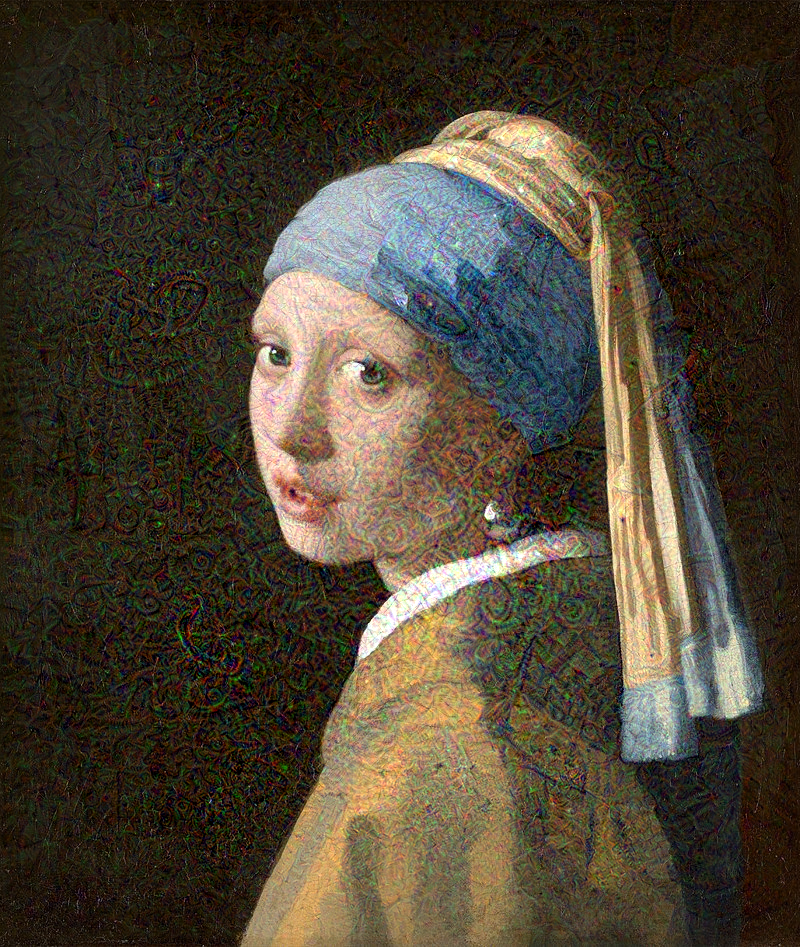